# 10. Interaction potentials& thermostats

## 10.1 Exercise: Canonical fluctuations

Show that the fluctuations of the temperature of the system, as defined in class, in the canonical ensemble are
$$\frac{\sigma_{T_K}^2}{\langle T_K\rangle^2}=\frac{\langle T_K^2\rangle-\langle T_K\rangle^2}{\langle T_K\rangle^2}=\frac{2}{3N}$$

-----------------------------------------------------------------------------------

$\textbf{Solution}$

Kinetic temperature $\rightarrow T_K= \frac{1}{3Nk_B}\sum \frac{p_x^2+p_y^2+p_z^2}{m}$ <br> 

Boltzmann velocity distribution $\rightarrow \mathcal{P}(p)=\left(\frac{\beta}{2\pi\mathfrak{m}}\right)^{3/2}\exp\left[-\frac{\beta (p_x^2+p_y^2+p_z^2)}{2m} \right].$

Mathematica compuation:<br>
$\begin{aligned} \left\langle{p}^{2}\right\rangle &=\int\mathrm{d}{p}\:\mathrm{p}^{2}\mathcal{P}({p}) \\&=
\int _{-\infty }^{\infty }\int _{-\infty }^{\infty }\int _{-\infty }^{\infty }\left(\frac{\beta}{2 \pi  m}\right)^{3/2} \left(p_x^2+p_y^2+p_z^2\right) \exp \left(-\frac{\beta p_x^2}{2 m}\right) \exp \left(-\frac{\beta p_y^2}{2 m}\right) \exp \left(-\frac{\beta p_z^2}{2 m}\right)dp_zdp_ydp_x \\&= \frac{3m}{\beta}\end{aligned}$


$\begin{aligned} \left\langle{p}^{4}\right\rangle &=\int\mathrm{d}{p}\:\mathrm{p}^{4}\mathcal{P}({p}) \\&=
\int _{-\infty }^{\infty }\int _{-\infty }^{\infty }\int _{-\infty }^{\infty }\left(\frac{\beta}{2 \pi  m}\right)^{3/2} \left(p_x^2+p_y^2+p_z^2\right)^2 \exp \left(-\frac{\beta p_x^4}{2 m}\right) \exp \left(-\frac{\beta p_y^4}{2 m}\right) \exp \left(-\frac{\beta p_z^4}{2 m}\right)dp_zdp_ydp_x \\&= \frac{15 m^2}{\beta^2}\end{aligned}$



$\begin{aligned}\frac{\sigma_{p^{2}}^{2}}{\left\langle p^{2}\right\rangle^{2}} = \frac{\left\langle p^{4}\right\rangle-\left\langle p^{2}\right\rangle^{2}}{\left\langle p^{2}\right\rangle^{2}}=\frac{15(m/\beta)^{2}-(3m/\beta)^{2}}{(3m/\beta)^{2}}=\frac{2}{3}.\end{aligned}$


$\begin{aligned}\frac{\sigma_{T_K}^2}{\langle T_K\rangle^2}=\frac{\langle T_K^2\rangle-\langle T_K\rangle^2}{\langle T_K\rangle^2} &= \quad\frac{N\left\langle p^{4}\right\rangle+N\left(N-1\right)\left\langle p^{2}\right\rangle\left\langle p^{2}\right\rangle-N^{2}\left\langle p^{2}\right\rangle^{2}}{N^{2}\left\langle p^{2}\right\rangle^{2}}\\&=\quad\frac{1}{N}\frac{\left\langle p^{4}\right\rangle-\left\langle p^{2}\right\rangle^{2}}{\left\langle p^{2}\right\rangle^{2}}\\&=\frac{2}{3N} \blacksquare. \end{aligned}$

# 10.2 Exercise: Lennard-Jones fluid in the microcanonical ensemble 

Simulate $N$ particles of mass $m=1$ that are confined to move within a cubic box of length $L$ (with periodice $N$ particles of mass $m=1$ that are confined to move within a cubic box of length $L$ (with þeriodice $N$ particles of mass $m=1$ that are co
boundary conditions). The particles interact with each other through a Lennard-Jones (LJ) potential:

$$V_{LJ}(r)=4\epsilon\left(\left(\frac{\sigma}{r}\right)^{12}-\left(\frac{\sigma}{r}\right)^6\right)$$
where $\sigma=1$ and $\epsilon=1.$ Choose $L=10\sigma$ and $\rho=N/V=0.2\sigma^{-3}.$ Integrate the equations of motion with the
Velocity Verlet algorithm. (This exercise can be carried on with LAMMPS)

$\bullet$ Generate a suitable, well equilibrated initial condition. Choose one of the two strategies introduced in one of the previous exercise sessions. Draw the initial velocity distribution from the equilibrium (Maxwell-Boltzmann) distribution at $T^*=1$, enforcing the total momentum to zero.

$\bullet$ Check the effect of the cut-off radius: perform different simulations, increasing the cut-off from $r_c=$ $2^{1/6}\sigma$ to $r_c=4\sigma$ with steps $\Delta r_c=0.2\sigma$ (round the numbers to the first decimal place after the first one). After equilibration (if needed), compute the radial distribution function to compare the different cases. <br>


Optional Do not enforce the initial momentum. Pick two extreme cases $r_c=2^{1/6}\sigma$ and $r_c=4\sigma$ and discuss what happens.


#### Lammps code notes


##### 1) Initialization

* `units lj`: Sets Lennard-Jones units for the simulation.
* `dimension 3`: Defines a three-dimensional space for the system.
* `atom_style atomic`: Specifies that atoms are treated as individual particles.
* `pair_style lj/cut 2.5`: Defines Lennard-Jones pair potential with a cutoff distance of 2.5.
* `boundary p p p`: Sets periodic boundary conditions in all directions.

##### 2) System Definition 

* `region simulation_box block -10 10 -10 10 -10 10`: Creates a simulation box with dimensions from -10 to 10 in all directions.
* `create_box 1 simulation_box`: Defines simulation box 1.
* `create_atoms 1 random 200 341341 simulation_box`: Creates 200 random atoms within the simulation box.

##### 3) Simulation Settings 

* `mass 1 1`: Sets the mass of all atoms to 1 (in LJ units).
* `pair_coeff 1 1 1.0 1.0`: Defines Lennard-Jones interaction parameters (sigma=1, epsilon=1) for all atom pairs.

#### 4) Visualization

* `thermo 1`: Prints thermodynamic data every timesteps.
* `thermo_style custom step temp pe ke etotal press density`: Defines custom output format including step number, temperature, potential energy, kinetic energy, total energy, pressure, and density.

##### 5) Energy Minimization

* `minimize 1.0e-4 1.0e-6 1000 10000`: Minimizes the system's energy until the change in energy is less than 1.0e-4, maximum force is less than 1.0e-6, a maximum of 1000 iterations are reached, or a maximum of 10000 energy/force evaluations are performed.

##### 6) Output Trajectory (Save Data)

* `dump mydump all custom 50 Ex10.2.lammpstrj id type x y z vx vy vz`: Dumps a trajectory file every 50 timesteps, containing information about atom IDs, positions (x, y, z), and velocities (vx, vy, vz).

##### 7) Simulation Run (NVE Ensemble)

* `fix mynve all nve`: Sets number of atoms, volume, and total energy as constant. Uses Vel-verlet.
* `fix 2 all temp/rescale 1 2.0 2.0 0.1 1.0`: Rescales the temperature to 2.0 with a period of 2.0 picoseconds, a tau-p value of 0.1 picoseconds, and a damping time of 1.0 picoseconds to maintain a constant temperature.
* `timestep 0.005`: Sets the timestep to 0.005 picoseconds.
* `run 1000`: Runs the simulation for 1000 timesteps.

##### 8) Radial Distribution Function (RDF) Calculation

* `compute myRDF all rdf 50 cutoff 10`: calculate the radial distribution function (RDF) every 50 timesteps with a cutoff radius of 10.
* `fix ave_rdf all ave/time 1 1 1`: continuously accumulate the time average of the RDF for all atoms.

##### 9) Run for RDF Data Collection

* `run 1000`: Runs to collect data for the RDF calculation.



In [1]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image

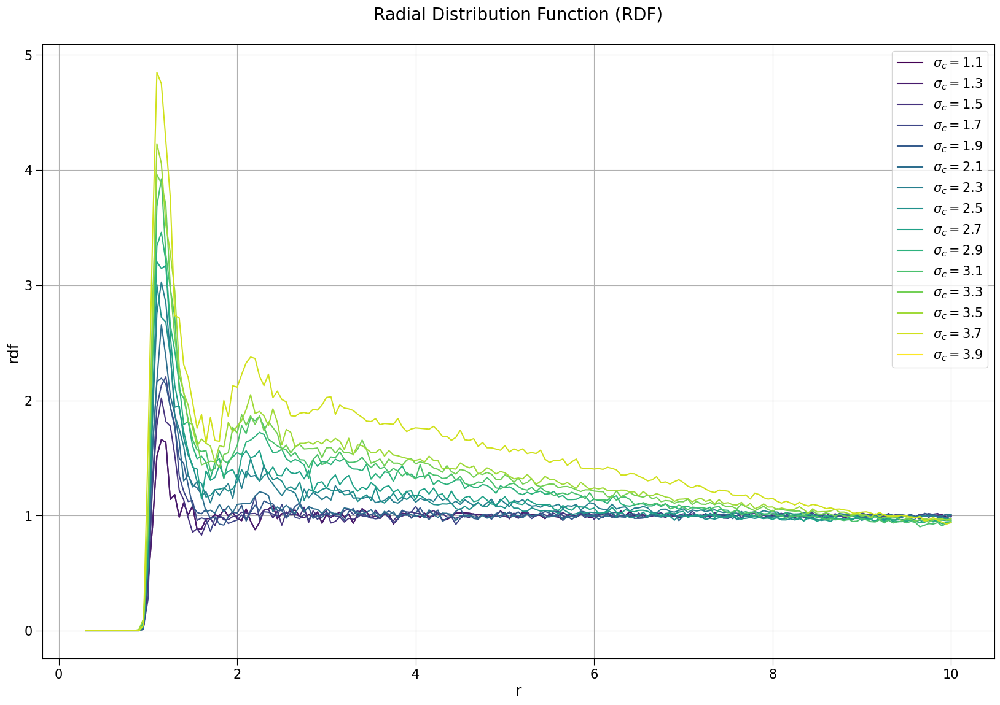

In [2]:
# Cutoff sigma
sigma_c = [11,13,15,17,19,21,23,25,27,29,31,33,35,37,39]

# Colormap 
cmap = plt.cm.viridis
norm = plt.Normalize(min(sigma_c), max(sigma_c))

# plot
plt.figure(figsize=(20,13))
for _ in sigma_c:
    filename = f"/home/gloria/Scrivania/Numerical methods soft matter/10Exercise/data/Ex10.2_{_}_RDF.dat"
    
    with open(filename, "r") as file:
        lines = file.readlines()[4:]

    # take the last 200 lines and extract bins and counts
    for i in range(1):
        i = 10
        bins = []
        counts = []

        for line in lines[5+201*i:200+201*i]:
            data = line.split()
            bins.append(float(data[0]))
            counts.append(float(data[2]))

        # plot
        plt.plot(np.array(bins)*0.05, counts, label = f"$\sigma_c={_/10}$",color=cmap(norm(_)))
        plt.xlabel("r",fontsize=18)
        plt.ylabel("rdf",fontsize=18)
        plt.title("Radial Distribution Function (RDF)\n",fontsize=20)
        plt.legend(loc='upper right', fontsize=15)
        plt.tick_params(axis='both', which='major', labelsize=15, size=8)  # Set tick size and font size
        plt.grid(True)
plt.show()


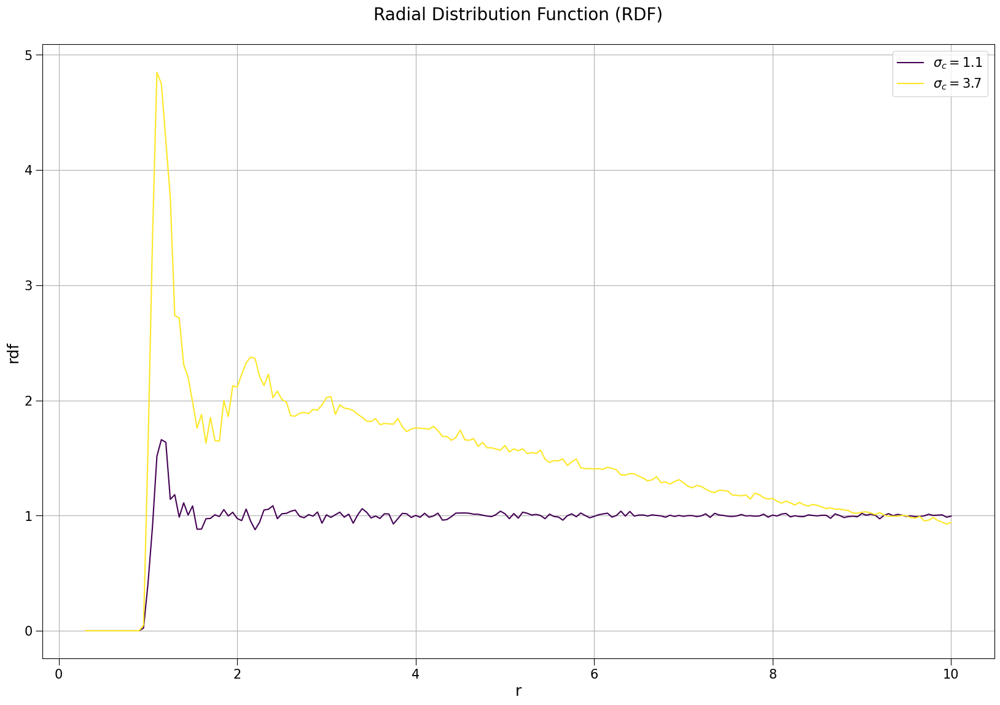

In [3]:
# Cutoff sigma
sigma_c = [11,37]

# Colormap 
cmap = plt.cm.viridis
norm = plt.Normalize(min(sigma_c), max(sigma_c))

# plot
plt.figure(figsize=(20,13))
for _ in sigma_c:
    filename = f"/home/gloria/Scrivania/Numerical methods soft matter/10Exercise/data/Ex10.2_{_}_RDF.dat"
    
    with open(filename, "r") as file:
        lines = file.readlines()[4:]

    # take the last 200 lines and extract bins and counts
    for i in range(1):
        i = 10
        bins = []
        counts = []

        for line in lines[5+201*i:200+201*i]:
            data = line.split()
            bins.append(float(data[0]))
            counts.append(float(data[2]))

        # plot
        plt.plot(np.array(bins)*0.05, counts, label = f"$\sigma_c={_/10}$",color=cmap(norm(_)))
        plt.xlabel("r",fontsize=18)
        plt.ylabel("rdf",fontsize=18)
        plt.title("Radial Distribution Function (RDF)\n",fontsize=20)
        plt.legend(loc='upper right', fontsize=15)
        plt.tick_params(axis='both', which='major', labelsize=15, size=8)  # Set tick size and font size
        plt.grid(True)
plt.show()


### Discussion of the results

Lennard-Jones potential consists of a repulsive term, which accounts for the Pauli exclusion principle (when electron clouds repel each other due to their negative charge), and an attractive term, which accounts for van der Waals forces (attraction between molecules or atoms due to temporary dipoles). The expression of the potential is:

$$V_{LJ}(r)=4\epsilon\left(\left(\frac{\sigma}{r}\right)^{12}-\left(\frac{\sigma}{r}\right)^6\right)$$

In simulations, it's often computationally expensive to calculate interactions between all particles, especially in large systems. Hence, a cutoff distance $ r_{\text{cut}} $ is introduced beyond which the potential is assumed to be zero, effectively truncating the interaction. This helps in reducing computational cost while still capturing the significant interactions within a system. The choice of $ r_{\text{cut}} $ depends on a the tradeoff between accuracy and computational efficiency.


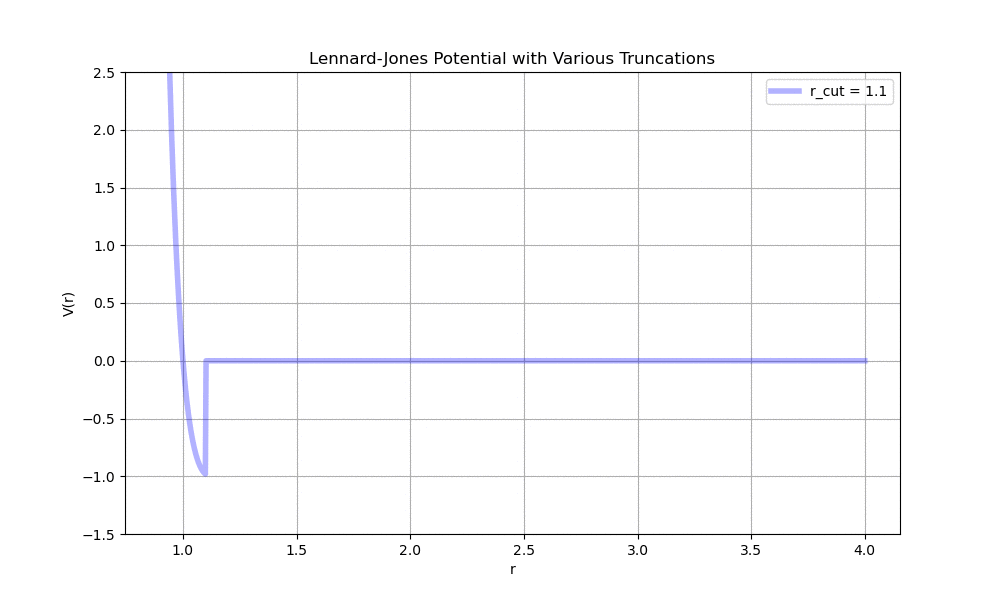

In [4]:
# LJ potential with different r_cut GIF
Image(filename='lj_potential.gif')

The cutoff radius value significantly affects the RDF, which describes the probability of finding an atom at a specific distance from a reference atom.

**Smaller r_c**:
 - smaller computational cost
 - the potential is truncated 8as we can see from the above gif) and we observe a sharp drop in the RDF value around $r_c$.This occurs because particles near the cutoff distance experience sudden changes in their interactions.
 - the shape of the RDF curve is more localized, reflecting the limited range of interactions considered. 

**Larger r_c**:
  - The RDF curve will have a smoother decay as it accounts for longer-range interactions.
  - there are 2 main peaks in the RDF;
  - The higher $\sigma_c$ the less the potential is truncated, allowing interaction with particles at larger distance.
  - Particles tend to group into small clusters of 5 particles each, within the range from $[r_{min}, r_{min}+dr]$.
  
As $\sigma_c$ increases, the probability of locating particles fluctuates around approximately 1, highlighting a lack of any clear order within the system.

### gif
Exemple of gif of radial distribution funciton over timesteps for the system with the smallest $\sigma_c$.

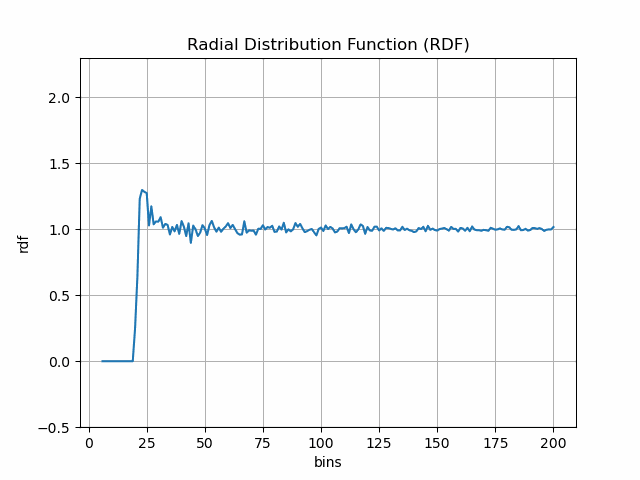

In [4]:
import matplotlib.pyplot as plt
from PIL import Image
from IPython.display import display, Image as IPImage
import os

display(IPImage("rdf_animation.gif"))


## 10.3 Exercise B, Ideal gas of dumbbells

Consider a system made of $N=100$ non-interacting dumbbells, each one made of two particles, held together by an harmonic spring with rest distance $r_0=1,$ ($r_0$ sets the unit of length). Set, for simplicity, a box $L=10$ units with periodic boundary conditions. Set the dumbbells initially at random positions in the box; each dumbbell should be at its rest length. Set the initial velocities as in the first exercise (Remember! Each dumbbell is in practice a different system!). Integrate the equations of motion with the Velocity Verlet algorithm. Among the different choices

  - Velocity rescaling

   - Berendsen thermostat

   - Andersen thermostat

   - Nose-Hoover thermostat 
<br>

pick two, a non-canonical and a canonical thermostat. Fix the reference temperature of the heath bath $T^*=2.$

   - Compute the kinetic energy and verify that the average is consistent with the equipartition theorem $\langle E_{K}{\rangle } = 3/ 2$ $Nk_{B}T.$

   - Check that the fluctuations of the temperature are consistent/not consistent with the canonical ensemble.

   - Check the dyamics of the system in the two cases, by computing the Mean Square Displacement of the dumbbells. Discuss what happens.
   
   

#### Lammps code notes


##### 1) Initialization

* `units lj`: Sets Lennard-Jones units for the simulation.
* `dimension 3`: Defines a three-dimensional space for the system.
* `atom_style atomic`: Specifies that atoms are treated as individual particles.
* `boundary p p p`: Sets periodic boundary conditions in all directions.

##### 2) System Definition 

* `region simulation_box block -10 10 -10 10 -10 10`: Creates a simulation box with dimensions from -10 to 10 in all directions.
* ` create_box 2 simulation_box bond/types 1 extra/bond/per/atom 1 `: Defines simulation box 1.
* `molecule dumbell dumbell.mol`: use the molecule file to determine the molecule shape
* ` create_atoms 0 random 100 678865 simulation_box mol dumbell 8751`: Creates 200 random molecules within the simulation box.

##### 3) Simulation Settings 

* `mass 1 1`: Sets the mass of atom 1 in the molecule to 1 (in LJ units).
* `mass 2 1`: Sets the mass of atom 2 in the molecule to 1
* `bond_coeff 1 8.0 1.0`: Defines harmonic interaction parameters (K=8, r_0 = 1) for all molecules.

##### 4) Energy Minimization

* `minimize 1.0e-4 1.0e-6 1000 10000`: Minimizes the system's energy until the change in energy is less than 1.0e-4, maximum force is less than 1.0e-6, a maximum of 1000 iterations are reached, or a maximum of 10000 energy/force evaluations are performed.
* `reset_timestep 0`: resets the timestep counter

##### 5) Velocity initialization

* `velocity all create 2 4928459 rot yes dist gaussian`: initialize velocities
* `run 0`:
* `velocity all scale 2`: rescale them 


##### 6) Visualization

* `thermo 1`: Prints thermodynamic data every timesteps.
* `thermo_style custom step temp pe ke etotal press density c_MSD[1] c_MSD[2] c_MSD[3]`: Defines custom output format including step number, temperature, potential energy, kinetic energy, total energy, pressure, density and Mean squared displacement in all directions.

##### 7) Mean squared displacement (MSD) Calculation

* `compute MSD  all msd`: calculate the mean squared displacement for all particles

##### 8) Simulation Run (NVE Ensemble)

- A) ***Berendsen thermostat*** 
* `fix mynve all nve`: Sets number of atoms, volume, and total energy as constant. Uses Vel-verlet integrator.
* `fix berendsen all temp/berendsen 2.0 2.0 0.1`: use brendesen thermostat with T*=2 and T_dump = 0.1
* `thermo_style custom step temp pe ke etotal press density c_MSD[1] c_MSD[2] c_MSD[3]` : show in the output file Teperature, energy, pressure, MSD on 3 directions

- B) ***Nose-Hoover thermostat*** 
* `fix nvt  all nvt temp 2.0 2.0 1`: use noose hoover thermostat and verlet integrator with T*=2 and T_dump = 0.1
* `thermo_style custom step temp pe ke etotal press density c_MSD[1] c_MSD[2] c_MSD[3]` : show in the output file Teperature, energy, pressure, MSD on 3 directions

##### 9) Output Trajectory (Save Data)
* `dump mydmp all custom 10 dump.lammpstrj id type x y z vx vy vz`: Dumps a trajectory file every 50 timesteps, containing information about atom IDs, positions $(x, y, z)$, and velocities $(v_x, v_y, v_z)$.
* `run 1000`: Runs the simulation for 1000 timesteps.


The relative variance of Tk is:

Expected value for canonical ensemble --> 0.0066
Nosé-Hoover --> 0.006396540350731333
Berendsen --> 1.159548637783289e-05


The average kinetic energy per particle <Ek> is:

Expected value for T*=2 --> 3
Nosé-Hoover --> 2.9972697727
Berendsen --> 2.9843434875500003


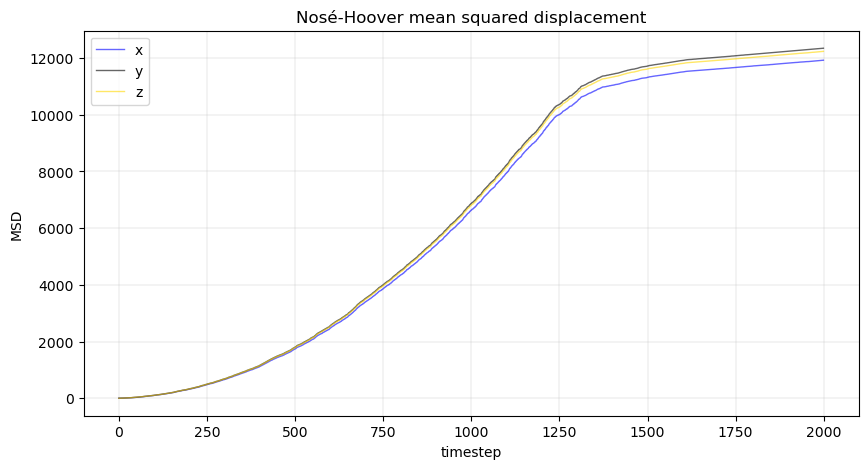

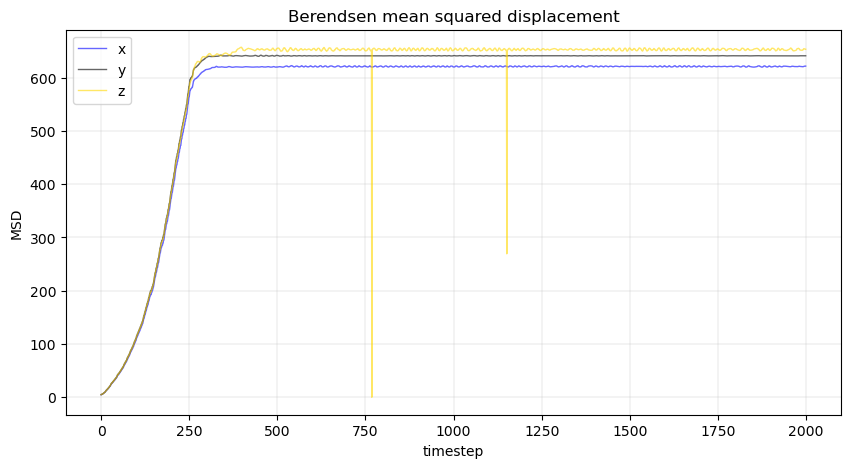

In [68]:
# load Lammps results for the 2 thermostats (1 canonical and 1 non canonical)
data_nv = np.loadtxt('data_nv_long2.csv', delimiter=',', skiprows=1) # Nosé-Hoover
data_b = np.loadtxt('data_berendsen_long.csv', delimiter=',', skiprows=1)  # Berendsen
N = 100

# compute temperatures fluctuations (or equivalently, Ek fluctuations)
Tk_nv = data_nv[:,1][5000:7000]
Tk_b = data_b[:,1][1000:5000]

print('The relative variance of Tk is:\n')
print('Expected value for canonical ensemble -->', 0.0066)
print('Nosé-Hoover -->', np.var(Tk_nv)/np.mean(Tk_nv)**2)
print('Berendsen -->', np.var(Tk_b)/np.mean(Tk_b)**2)

# compute average kinetic energy
Ek_nv = data_nv[:,3][5000:7000]
Ek_b = data_b[:,3][1000:5000]
print('\n\nThe average kinetic energy per particle <Ek> is:\n')
print('Expected value for T*=2 -->', 3)
print('Nosé-Hoover -->', np.mean(Ek_nv) )
print('Berendsen -->', np.mean(Ek_b) )

# show Mean Square Displacement
plt.figure(figsize=(10,5))
plt.title('Nosé-Hoover mean squared displacement')
plt.xlabel('timestep')
plt.ylabel('MSD')
plt.plot(data_nv[:,7][:2000], linewidth = 1, color = 'blue', alpha = 0.6, label= 'x')
plt.plot(data_nv[:,8][:2000], linewidth = 1, color = 'black', alpha = 0.6, label= 'y')
plt.plot(data_nv[:,9][:2000], linewidth = 1, color = 'gold', alpha = 0.6, label= 'z')
plt.grid(linewidth=0.2)
plt.legend()
plt.show()


plt.figure(figsize=(10,5))
plt.title('Berendsen mean squared displacement')
plt.xlabel('timestep')
plt.ylabel('MSD')
plt.plot(data_b[:,7][:2000], linewidth = 1, color = 'blue', alpha = 0.6, label= 'x')
plt.plot(data_b[:,8][:2000], linewidth = 1, color = 'black', alpha = 0.6, label= 'y')
plt.plot(data_b[:,9][:2000], linewidth = 1, color = 'gold', alpha = 0.6, label= 'z')
plt.grid(linewidth=0.2)
plt.legend()
plt.show()

The Nosé-Hoover thermostat seems to perform slightly better in terms of temperature fluctuations, with a relative variance closer to the expected value for the canonical ensemble. Conversely the Berendsen thermostat does not reproduce the canonical distribution of energies.

Both thermostats seem to slightly underestimate the average kinetic energy per particle compared to the expected value. However, the deviations are relatively small, indicating that both thermostats are reasonably consistent with the equipartition theorem.

Regarding the MSD, in both cases the growing curve followed by a plateau indicates that particles initially diffuse throughout the system but eventually reach a dynamic equilibrium where their diffusion stabilizes. Diffusion occurs uniformly in all directions.

Berendsen thermostat:


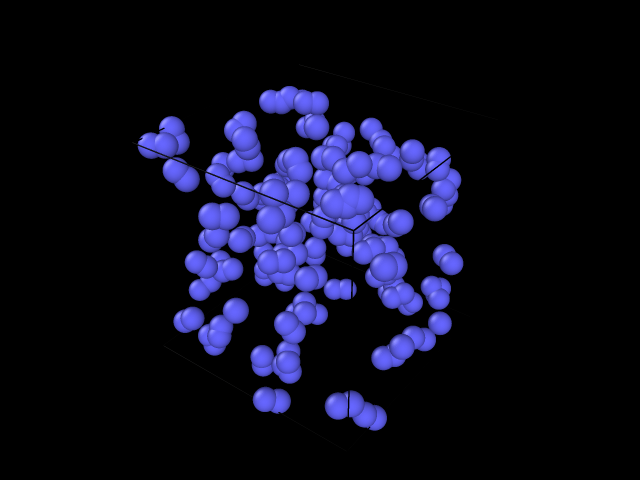

Nosé-Hoover thermostat:


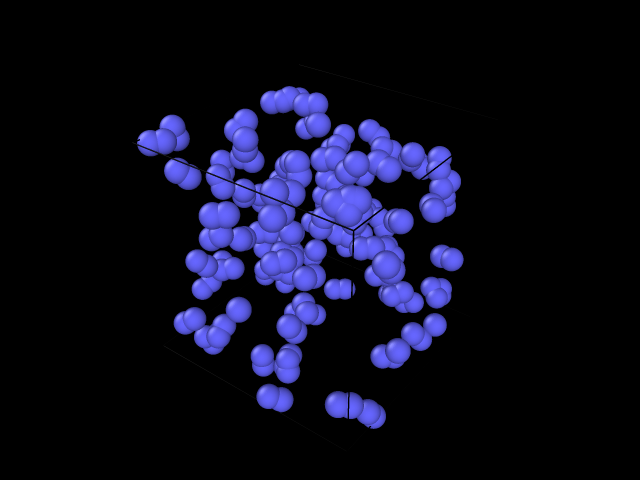

In [67]:
from IPython.display import display, Image as IPImage
print("Berendsen thermostat:")
display(IPImage("gif_b.gif"))
print("Nosé-Hoover thermostat:")
display(IPImage("gif_nv.gif"))